In [1]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import segmentation_models as sm
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU
import random

sm.set_framework('tf.keras')
sm.framework()

from keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
from tensorflow.keras.utils import to_categorical

from keras.utils.vis_utils import plot_model

from sklearn import metrics

import math
import pandas as pd

import seaborn as sns

import ast
import json

Segmentation Models: using `keras` framework.


In [2]:
def preprocess_data(img, mask, num_class):
    #Scale images
    img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
    mask = to_categorical(mask, num_class)
      
    return (img,mask)

In [3]:
def trainGenerator(train_img_path, train_mask_path, num_class):
    
    img_data_gen_args = dict(horizontal_flip = True,
                      vertical_flip = True,
                      fill_mode = 'reflect')
    
    image_datagen = ImageDataGenerator(**img_data_gen_args)
    mask_datagen = ImageDataGenerator(**img_data_gen_args)
    
    image_generator = image_datagen.flow_from_directory(
        train_img_path,
        class_mode = None,
        target_size = (64, 64),
        batch_size = batch_size,
        seed = seed)
    
    mask_generator = mask_datagen.flow_from_directory(
        train_mask_path,
        class_mode = None,
        target_size = (64, 64),
        color_mode = 'grayscale',
        batch_size = batch_size,
        seed = seed)
    
    train_generator = zip(image_generator, mask_generator)
    
    for (img, mask) in train_generator:
        img, mask = preprocess_data(img, mask, num_class)
        yield (img, mask)

In [4]:
seed = 24
batch_size = 16
n_classes = 8

In [5]:
model_names = ['Unet-resnet50', 'Unet-resnet101', 'Unet-resnet152', 'Unet-densenet121', 'Unet-densenet169',
               'Unet-vgg19', 'FPN-vgg16', 'Linknet-mobilenetv2']

# model_names = ['Unet-resnet50', 'Unet-resnet101']
models_path = '/home/shrayank_mistry/Modules/current_models/model_stats/'

In [6]:
models = []
for m in model_names:
    md = m.split('-')[0]
    bk = m.split('-')[1]

    print(md, bk)
    models.append(load_model(models_path + f'{md}_{bk}/model.hdf5', compile = False))

Unet resnet50
Unet resnet101
Unet resnet152
Unet densenet121
Unet densenet169
Unet vgg19
FPN vgg16
Linknet mobilenetv2


In [7]:
models

In [8]:
test_img_path = '/home/shrayank_mistry/Modules/data/kaggle_data/test_images/'
test_msk_path = '/home/shrayank_mistry/Modules/data/kaggle_data/test_masks/'

# test_img_path = '/home/shrayank_mistry/Modules/data/kaggle_data/main_test_image/'
# test_msk_path = '/home/shrayank_mistry/Modules/data/kaggle_data/main_test_mask/'

test_img_gen = trainGenerator(test_img_path, test_msk_path, num_class = n_classes)

In [9]:
image_cnt = len(os.listdir(test_img_path + 'test/'))
image_cnt

16677

### Storing IoU Comparison stats for Models

In [10]:
iou_storage = {}
itrs = image_cnt // batch_size
# itrs = 10
index = 0
# itrs

for model in models:
    test_img_gen = trainGenerator(test_img_path, test_msk_path, num_class = n_classes)
    
    ious = []
    for i in range(itrs):
        test_image_batch, test_mask_batch = test_img_gen.__next__()


        test_mask_batch_argmax = np.argmax(test_mask_batch, axis = 3) 
        test_pred_batch = model.predict(test_image_batch)
        test_pred_batch_argmax = np.argmax(test_pred_batch, axis = 3)

        IOU_keras = MeanIoU(num_classes = n_classes)
        IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax) 
        
        ious.append(IOU_keras.result().numpy())
    
    iou_storage[model_names[index]] = np.array(ious).tolist()
    index = index + 1

p = '/home/shrayank_mistry/Modules/current_models/'
with open(f'{p}ious_batchwise.txt', 'w') as f:
    f.write(json.dumps(iou_storage))


Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.


### Storing Pixel Comparison stats for models

In [11]:
itrs

1042

In [13]:
pxs_storage = {}
index = 0

for model in models:
    test_img_gen = trainGenerator(test_img_path, test_msk_path, num_class = n_classes)
    pxs = []
    for i in range(itrs):
        test_image_batch, test_mask_batch = test_img_gen.__next__()

        test_mask_batch_argmax = np.argmax(test_mask_batch, axis = 3) 
        test_pred_batch = model.predict(test_image_batch)
        test_pred_batch_argmax = np.argmax(test_pred_batch, axis = 3)

        for j in range(batch_size):
            correct = test_pred_batch_argmax[j] == test_mask_batch_argmax[j]
            pxs.append(float(correct.sum() / (correct.shape[0] * correct.shape[1])))
    
    pxs_storage[model_names[index]] = np.array(pxs).tolist()
    index = index + 1

p = '/home/shrayank_mistry/Modules/current_models/'
with open(f'{p}pxs_imagewise.txt', 'w') as f:
    f.write(json.dumps(pxs_storage))

Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.


### Confusion Matrix for One Batch

In [14]:
itrs = image_cnt // batch_size
itrs

1042

In [15]:
model_names

['Unet-resnet50',
 'Unet-resnet101',
 'Unet-resnet152',
 'Unet-densenet121',
 'Unet-densenet169',
 'Unet-vgg19',
 'FPN-vgg16',
 'Linknet-mobilenetv2']

In [16]:
conf_storage = {}
index = 0

test_img_gen = trainGenerator(test_img_path, test_msk_path, num_class = n_classes)
test_image_batch, test_mask_batch = test_img_gen.__next__()

for model in models:

    test_mask_batch_argmax = np.argmax(test_mask_batch, axis = 3) 
    test_pred_batch = model.predict(test_image_batch)
    test_pred_batch_argmax = np.argmax(test_pred_batch, axis = 3)

    cs = 8
    confusion_matrix = np.zeros((cs, cs), dtype = 'int')

    for x in range(batch_size):
        target = test_mask_batch_argmax[x]
        prediction = test_pred_batch_argmax[x]   

        r = target.shape[0]
        c = target.shape[1]

        for i in range(r):
            for j in range(c):
                target_pixel = target[i][j]
                predict_pixel = prediction[i][j]
                
                confusion_matrix[predict_pixel][target_pixel] += 1
        
    conf_storage[model_names[index]] = confusion_matrix.tolist()
    index = index + 1

p = '/home/shrayank_mistry/Modules/current_models/'
with open(f'{p}confusion_matrix.txt', 'w') as f:
    f.write(json.dumps(conf_storage))


Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.


### Confusion Matrix Visualization and Comparison

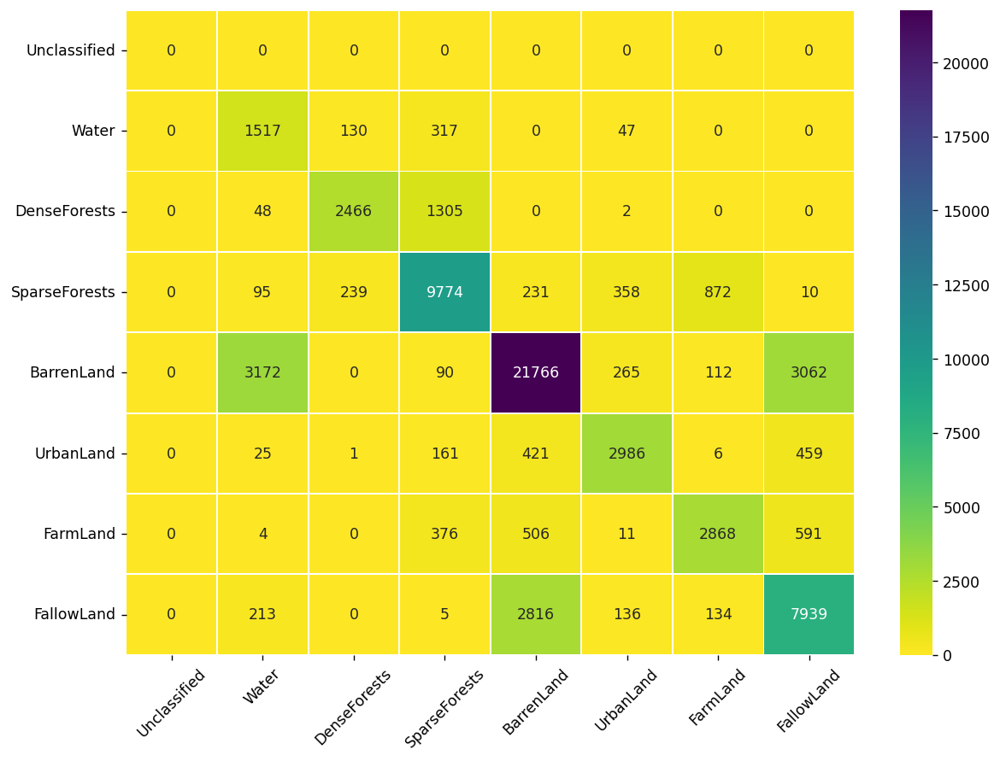

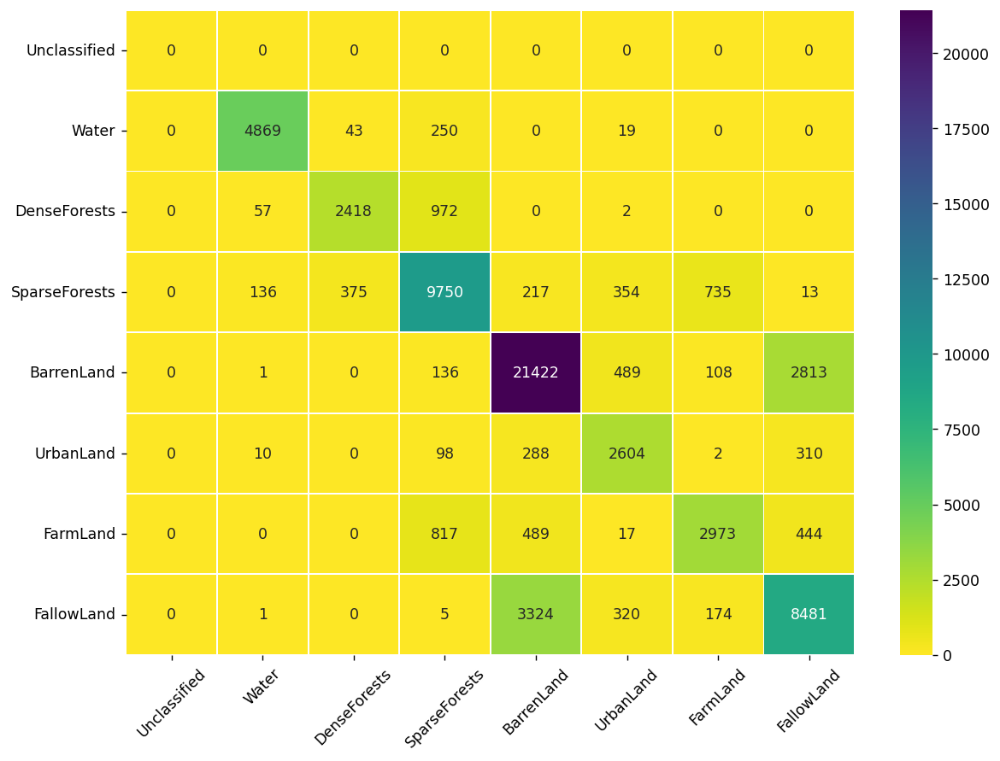

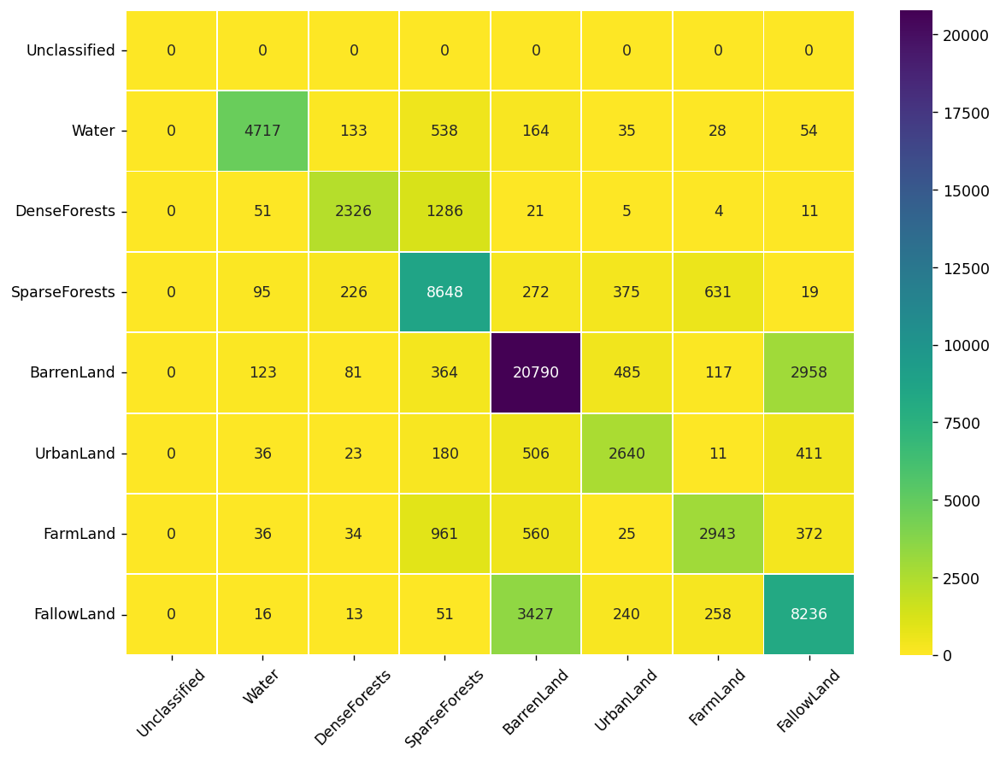

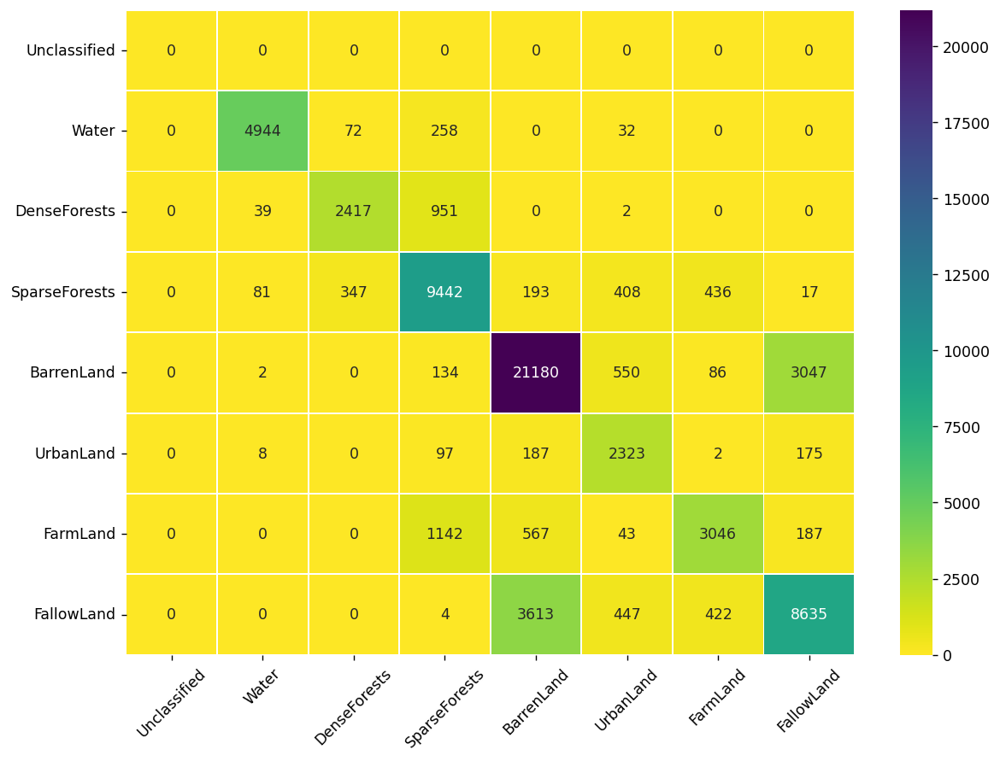

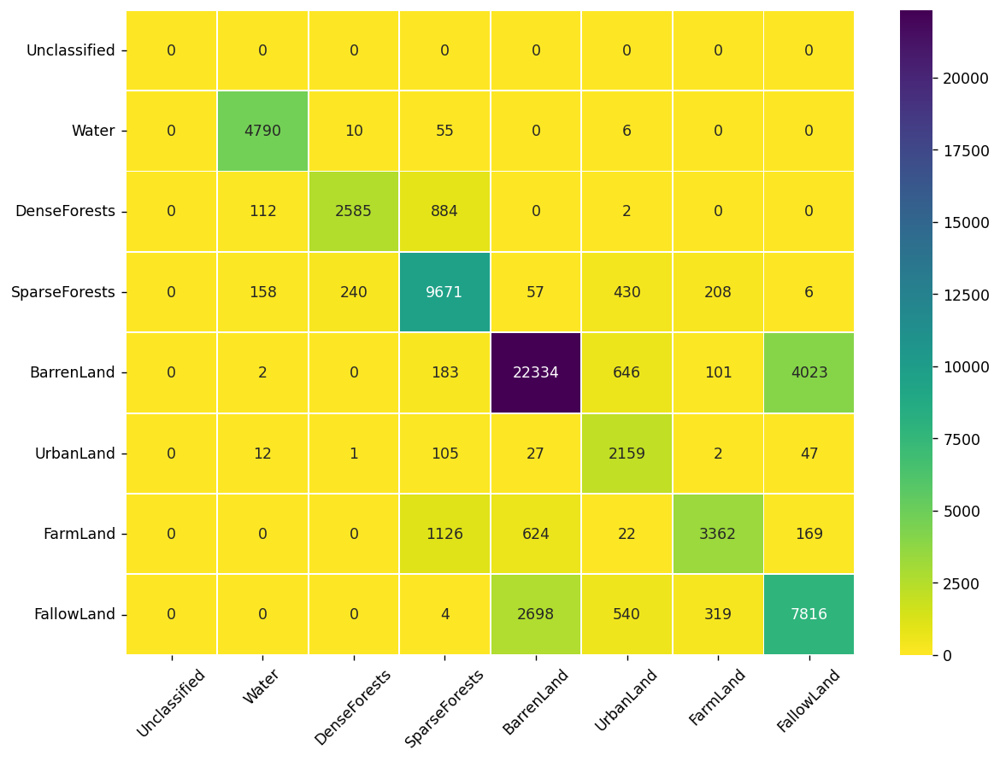

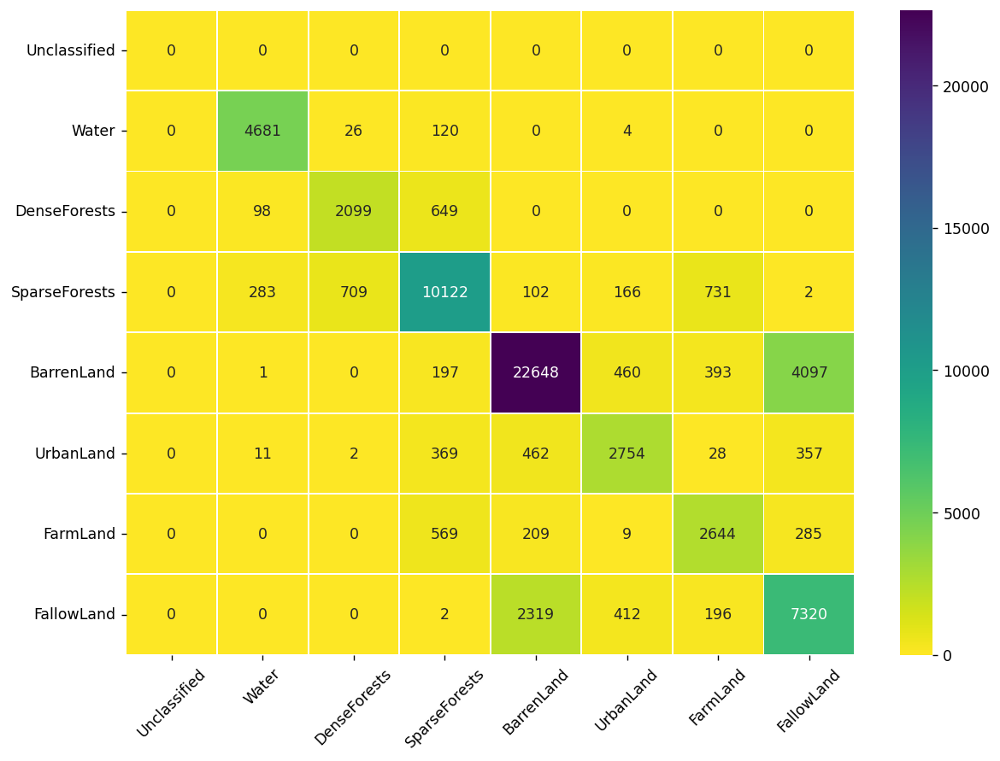

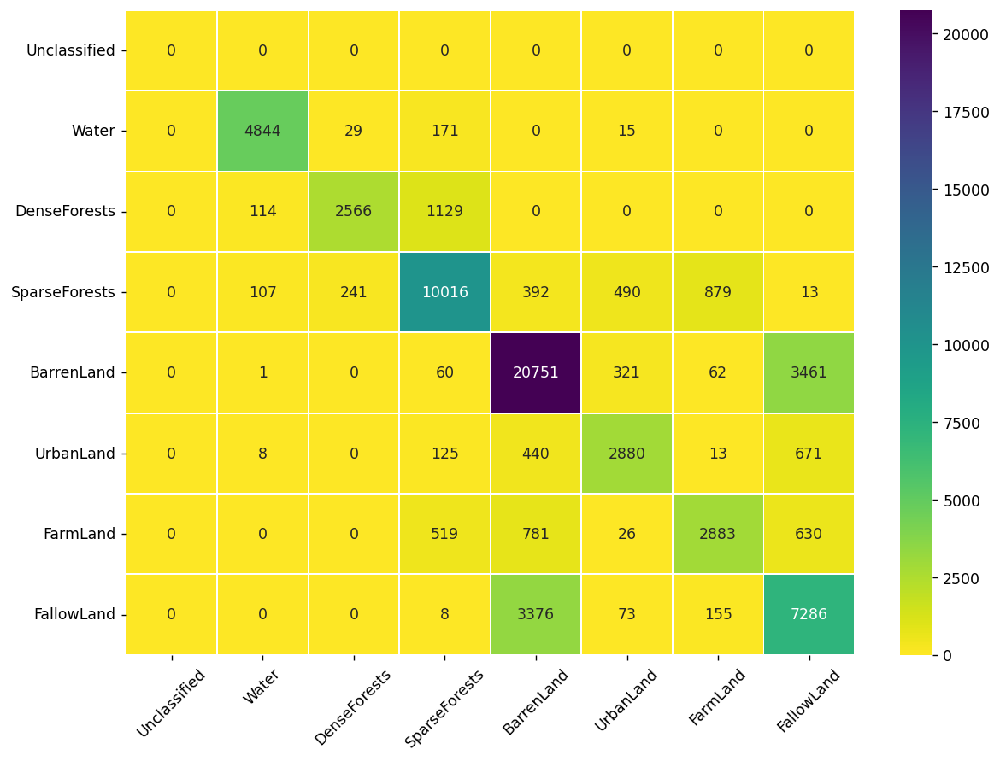

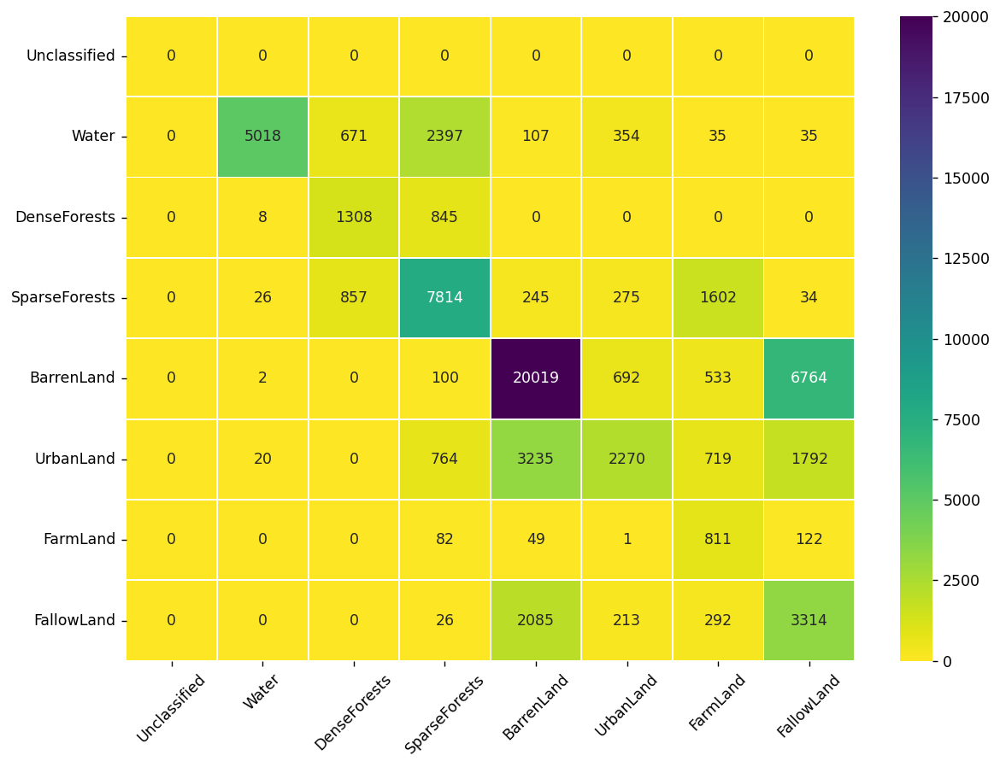

In [17]:
index = 0
p = '/home/shrayank_mistry/Modules/current_models/'
file = open(f'{p}confusion_matrix.txt', 'r')
contents = file.read()

dt = ast.literal_eval(contents)

for model in models:
    confusion_matrix = dt[model_names[index]]

    classes = ['Unclassified', 'Water', 'DenseForests', 'SparseForests', 'BarrenLand', 'UrbanLand', 'FarmLand', 'FallowLand']

    plt.figure(figsize = (11, 8), dpi = 125)

    cm_df = pd.DataFrame(data = confusion_matrix, index = classes, columns = classes)
    sns.heatmap(data = cm_df, annot = True, linewidths = 0.5, 
            cmap = 'viridis_r', fmt = 'd');

    plt.xticks(rotation = 45);
    plt.savefig(f'{p}Confusion matrics/{model_names[index]}_confusion.jpg', format = 'jpg', dpi = 600)

    index = index + 1


## Metrics Comparison for Models

$$Presision = \frac{TP}{TP + FP}$$
$$Recall = \frac{TP}{TP + FN}$$

$$Overall Accuracy = \frac{TP + TN}{TP + FP + TN + FN}$$

$$F1-Score = \frac{2 * TP}{2 * TP + FP + FN}$$

$$MCC = \frac{(TP * TN) - (FP * FN)}{\sqrt{(TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)}}$$

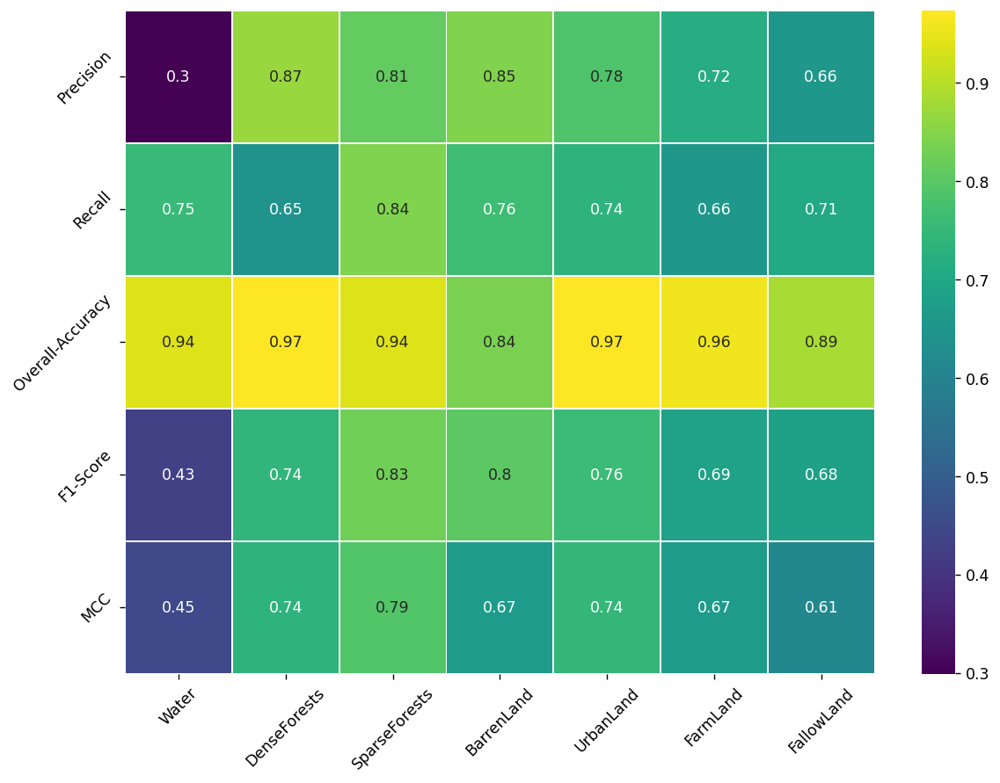

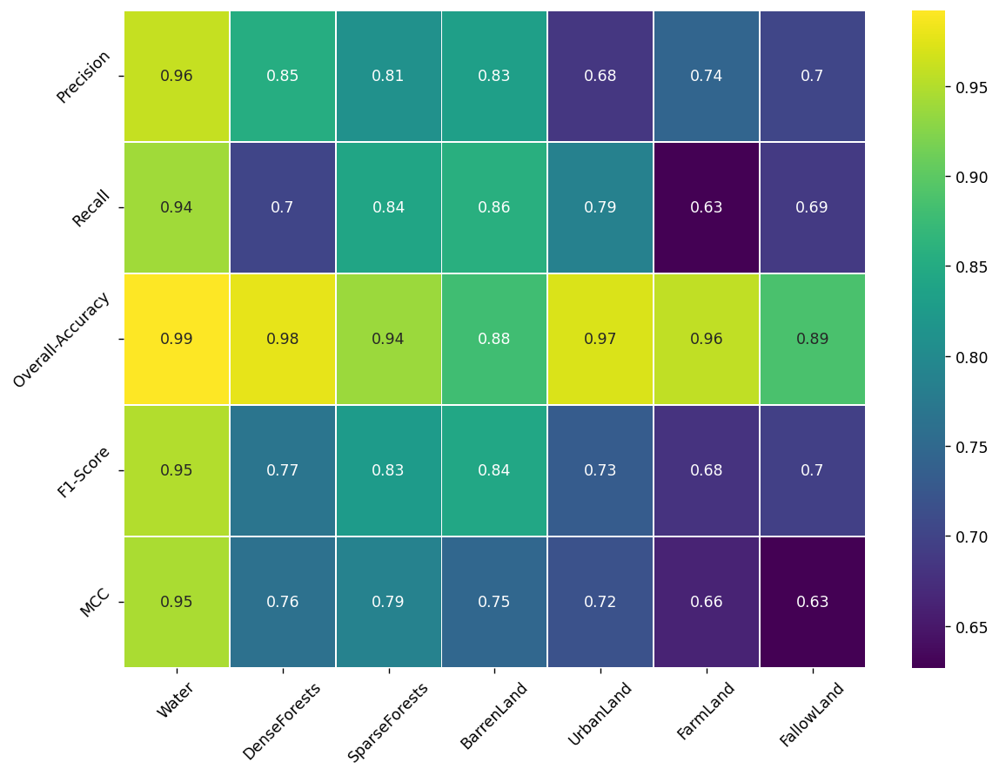

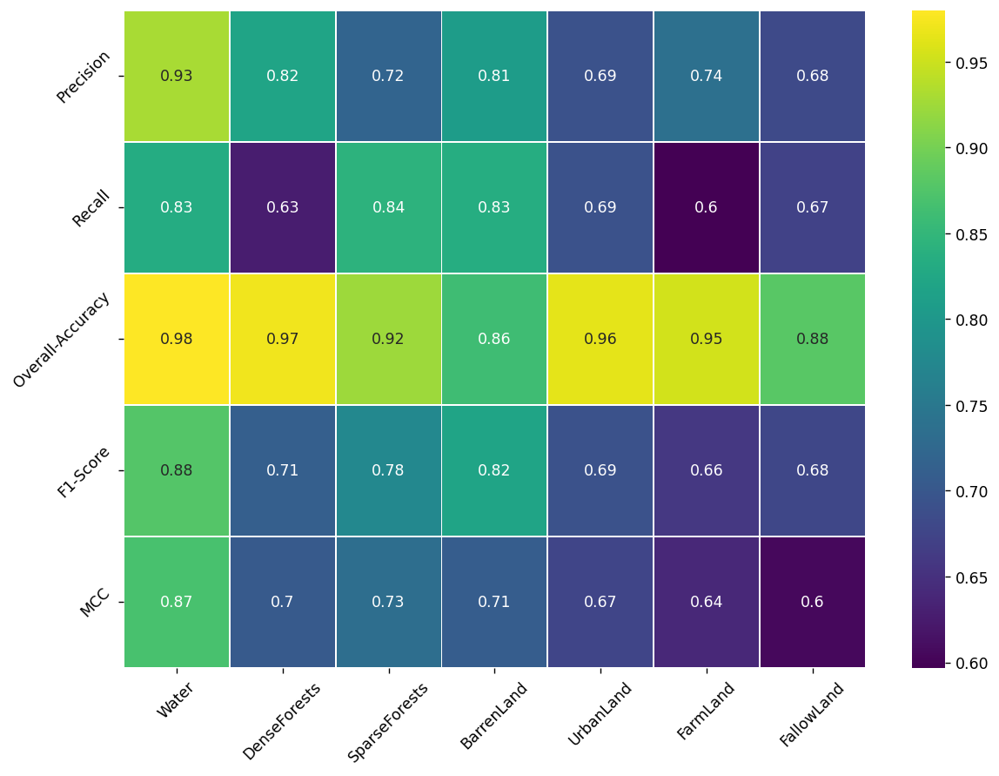

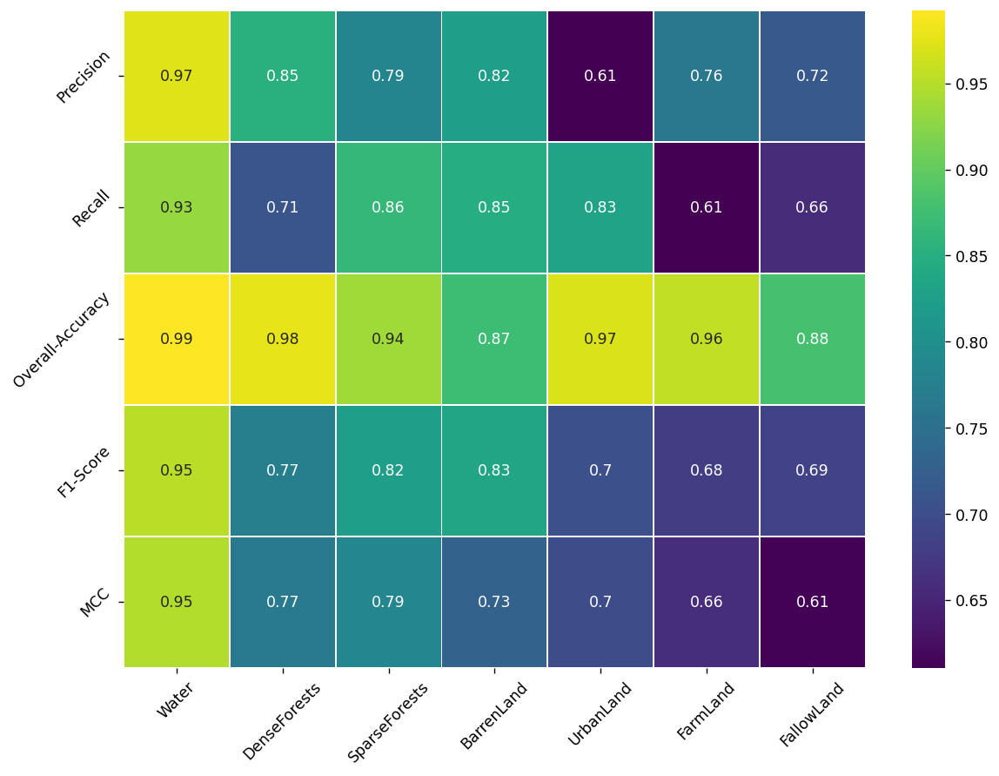

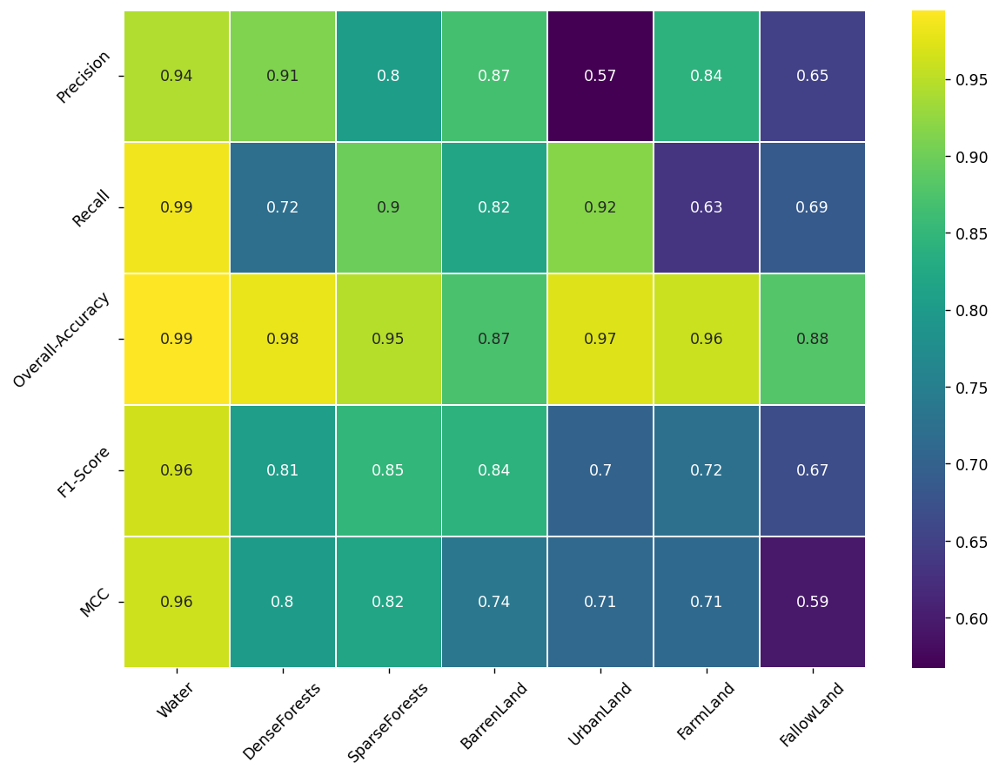

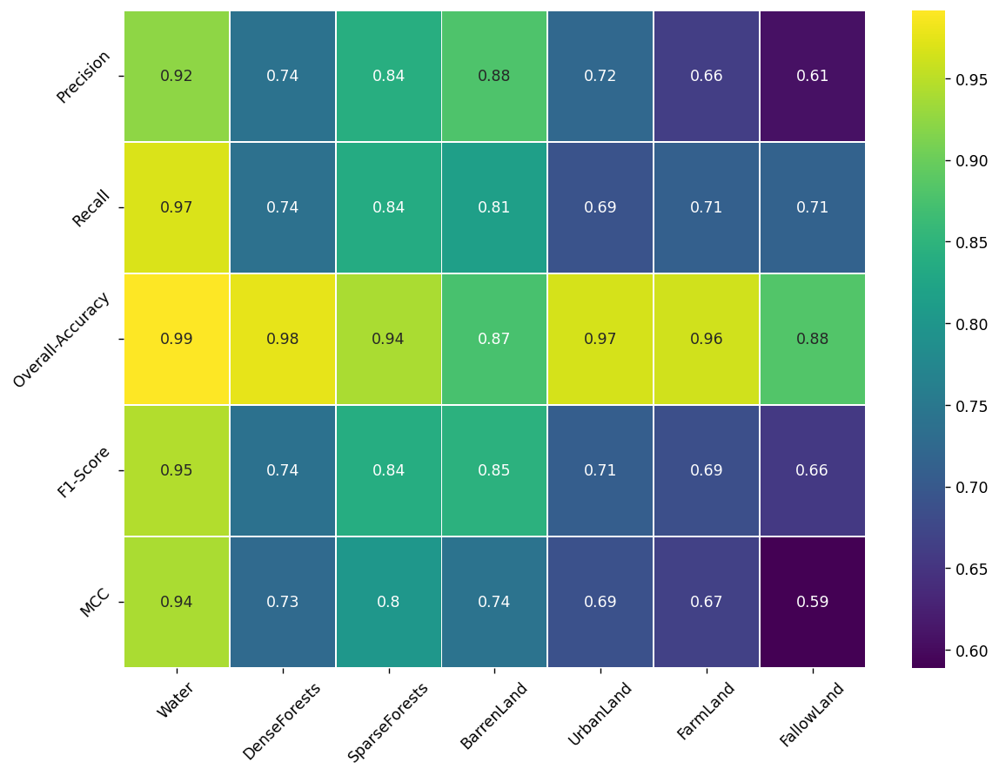

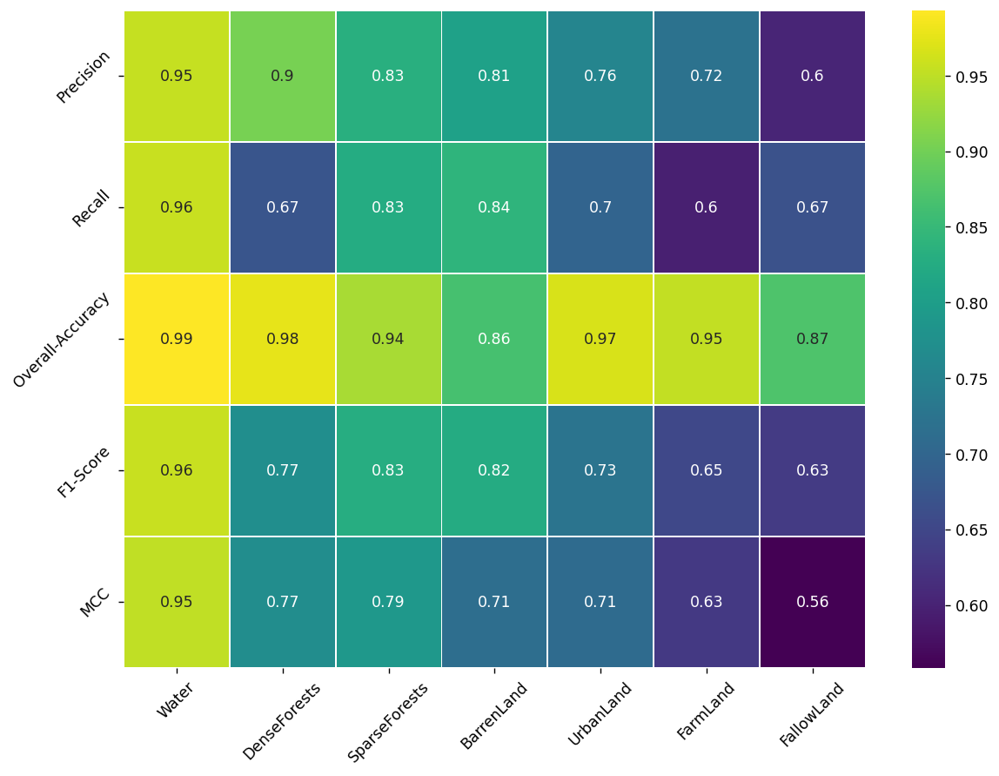

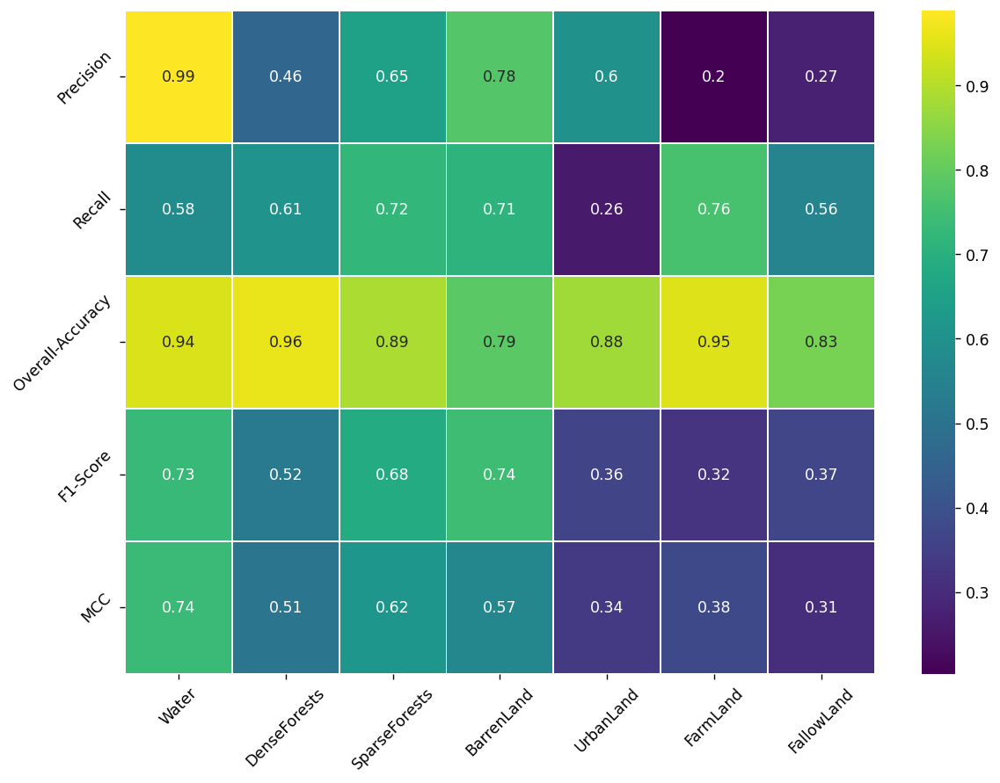

In [18]:
index = 0
path = '/home/shrayank_mistry/Modules/current_models/'
file = open(f'{path}confusion_matrix.txt', 'r')
contents = file.read()

dt = ast.literal_eval(contents)

for model in models:
    classes = ['Unclassified', 'Water', 'DenseForests', 'SparseForests', 'BarrenLand', 'UrbanLand', 'FarmLand', 'FallowLand']
    headers = ['Precision', 'Recall', 'Overall-Accuracy', 'F1-Score', 'MCC']

    confusion_matrix = dt[model_names[index]]

    metrics = {}
    for c in range(1, len(classes)):
        tp, fn, fp, tn = 0, 0, 0, 0

        p, r, o, f, m = 0, 0, 0, 0, 0

        # True Positive
        tp = confusion_matrix[c][c]
        
        # False Negative
        for i in range(len(classes)):
            if i == c: continue
            fn += confusion_matrix[c][i]
        
        # False Positive
        for i in range(len(classes)):
            if i == c: continue
            fp += confusion_matrix[i][c]
        
        # True Negative
        for i in range(len(classes)):
            if i == c: continue
            for j in range(len(classes)):
                if j == c: continue

                tn += confusion_matrix[i][j]
        
        # print(f'Class {c}, Metrics = [TP {tp}, FN {fn}, FP {fp}, TN {tn}]')

        p = tp / (tp + fp)
        r = tp / (tp + fn)
        o = (tp + tn) / (tp + fp + tn + fn)
        f = (2 * tp) / ((2 * tp) + (fp + fn))
        m = ((tp * tn) - (fp * fn)) / (math.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn)))

        metrics[classes[c]] = [p, r, o, f, m]
    
    df = pd.DataFrame(metrics, index = headers)
    plt.figure(figsize = (11, 8), dpi = 125)
    sns.heatmap(data = df, annot = True, linewidths = 0.5, cmap = 'viridis');

    # plt.savefig()
    plt.yticks(rotation = 45);
    plt.xticks(rotation = 45);
    plt.savefig(f'{path}/Metrics/{model_names[index]}_metrics.jpg', format = 'jpg', dpi = 600)

    index = index + 1
        

In [19]:
import matplotlib.colors
# 7 colors
# [Water, DenseForest, SparseForest, BarrenLand, UrbanLand, FarmLand, FallowLand]
# [#0033cc, #006600, #33cc33, #663300, #5200cc, #ffcc00, #e68a00]

cp = matplotlib.colors.LinearSegmentedColormap.from_list('', ['#0033cc', '#006600', '#33cc33', '#663300', '#5200cc', '#ffcc00', '#e68a00'])

In [20]:
batch_size = 32
test_img_gen = trainGenerator(test_img_path, test_msk_path, num_class = n_classes)

### Test Image Storing

Found 16677 images belonging to 1 classes.
Found 16677 images belonging to 1 classes.


/home/shrayank_mistry/Modules/virtualenv/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


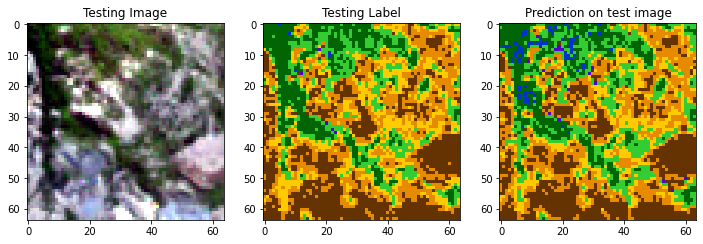

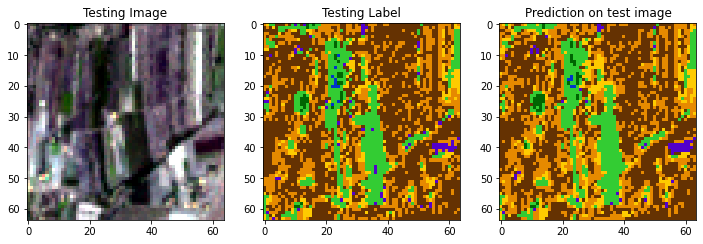

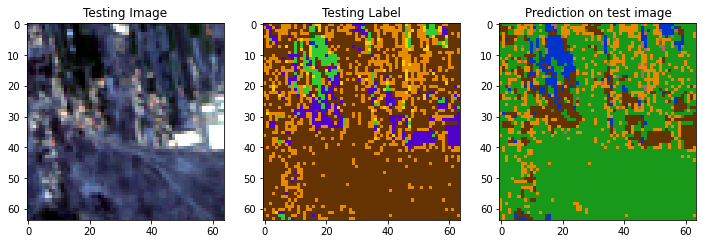

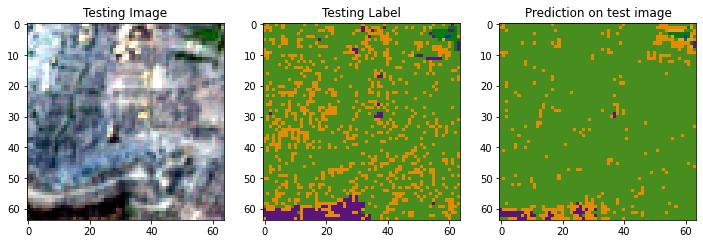

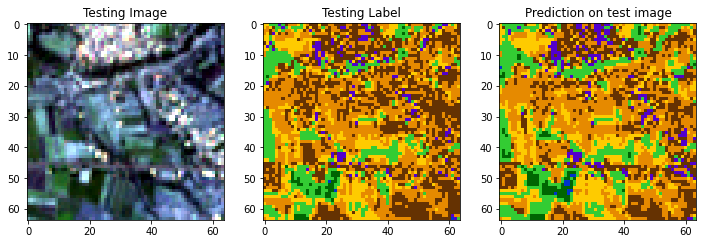

...

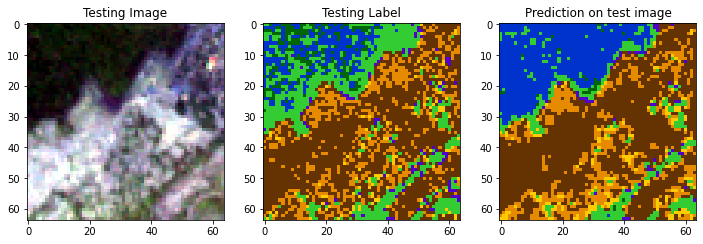

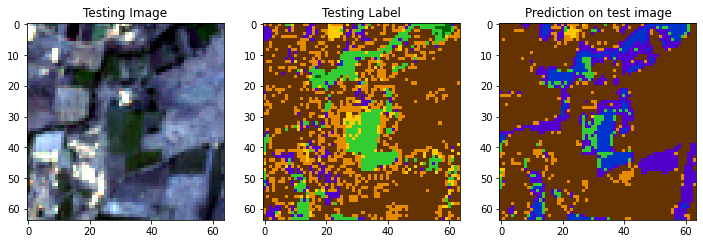

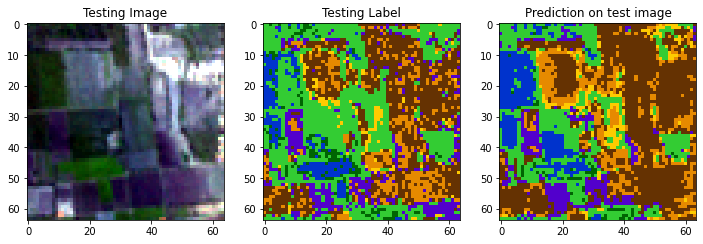

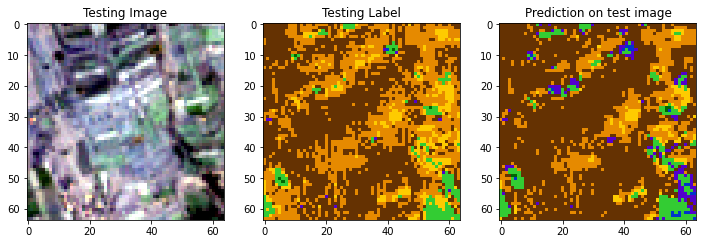

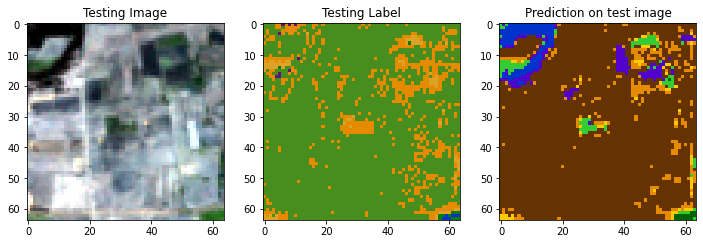

In [21]:
test_image_batch, test_mask_batch = test_img_gen.__next__()
index = 0
for m in model_names:
    md = m.split('-')[0]
    bk = m.split('-')[1]

    store_path = f'/home/shrayank_mistry/Modules/current_models/model_stats/{md}_{bk}/'
    os.mkdir(store_path + 'test_output/')

    test_mask_batch_argmax = np.argmax(test_mask_batch, axis = 3) 
    test_pred_batch = models[index].predict(test_image_batch)
    test_pred_batch_argmax = np.argmax(test_pred_batch, axis = 3)

    for i in range(batch_size):

        path = store_path + 'test_output/'
        # os.mkdir(path)
        plt.figure(figsize = (12, 10))
        plt.subplot(231)
        plt.title('Testing Image')
        plt.imshow(test_image_batch[i])
        # plt.savefig(f'{path}/image.jpg')

        plt.subplot(232)
        plt.title('Testing Label')
        plt.imshow(test_mask_batch_argmax[i], cmap = cp)
        # plt.savefig(f'{path}/mask.jpg')

        plt.subplot(233)
        plt.title('Prediction on test image')
        plt.imshow(test_pred_batch_argmax[i], cmap = cp)
        # plt.savefig(f'{path}/output_{i + 1}.jpg')
        # fig.savefig('myimage.svg', format='svg', dpi=1200)
        plt.savefig(f'{path}/output_{i + 1}.jpg', format = 'jpg', dpi = 600)
    
    index = index + 1

### Model comparison on metrics

In [22]:
index = 0
path = '/home/shrayank_mistry/Modules/current_models/'
file = open(f'{path}confusion_matrix.txt', 'r')
contents = file.read()

dt = ast.literal_eval(contents)
model_data = []

for model in models:
    classes = ['Unclassified', 'Water', 'DenseForests', 'SparseForests', 'BarrenLand', 'UrbanLand', 'FarmLand', 'FallowLand']
    headers = ['Precision', 'Recall', 'Overall-Accuracy', 'F1-Score', 'MCC']

    confusion_matrix = dt[model_names[index]]

    metrics = {}
    for c in range(1, len(classes)):
        tp, fn, fp, tn = 0, 0, 0, 0

        p, r, o, f, m = 0, 0, 0, 0, 0

        # True Positive
        tp = confusion_matrix[c][c]
        
        # False Negative
        for i in range(len(classes)):
            if i == c: continue
            fn += confusion_matrix[c][i]
        
        # False Positive
        for i in range(len(classes)):
            if i == c: continue
            fp += confusion_matrix[i][c]
        
        # True Negative
        for i in range(len(classes)):
            if i == c: continue
            for j in range(len(classes)):
                if j == c: continue

                tn += confusion_matrix[i][j]
        
        # print(f'Class {c}, Metrics = [TP {tp}, FN {fn}, FP {fp}, TN {tn}]')

        p = tp / (tp + fp)
        r = tp / (tp + fn)
        o = (tp + tn) / (tp + fp + tn + fn)
        f = (2 * tp) / ((2 * tp) + (fp + fn))
        m = ((tp * tn) - (fp * fn)) / (math.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn)))

        metrics[classes[c]] = [p, r, o, f, m]
    model_data.append(metrics)



classes = ['Unclassified', 'Water', 'DenseForests', 'SparseForests', 'BarrenLand', 'UrbanLand', 'FarmLand', 'FallowLand']
headers = ['Precision', 'Recall', 'Overall-Accuracy', 'F1-Score', 'MCC']


cmp_dict_water = {}   # Water Class
cmp_dict_dforest = {} # DenseForest
cmp_dict_sforest = {} # SparseForest
cmp_dict_barren = {}  # BarrenLand
cmp_dict_urban = {}   # UrbanLand
cmp_dict_farms = {}   # FarmLand
cmp_dict_fallow = {}  # FallowLand
 
index = 0
for mn in model_names:
    cmp_dict_water[mn] = model_data[index]['Water']
    cmp_dict_dforest[mn] = model_data[index]['DenseForests']
    cmp_dict_sforest[mn] = model_data[index]['SparseForests']
    cmp_dict_barren[mn] = model_data[index]['BarrenLand']
    cmp_dict_urban[mn] = model_data[index]['UrbanLand']
    cmp_dict_farms[mn] = model_data[index]['FarmLand']
    cmp_dict_fallow[mn] = model_data[index]['FallowLand']

    index = index + 1


index = 0

### Water Class Comparison

In [23]:
pd.set_option("display.precision", 4)
water_df = pd.DataFrame(cmp_dict_water, index = headers)
water_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.2990,0.2990,0.2990,0.2990,0.2990,0.2990,0.2990,0.2990
Recall,0.7544,0.7544,0.7544,0.7544,0.7544,0.7544,0.7544,0.7544
Overall-Accuracy,0.9382,0.9382,0.9382,0.9382,0.9382,0.9382,0.9382,0.9382
F1-Score,0.4282,0.4282,0.4282,0.4282,0.4282,0.4282,0.4282,0.4282
MCC,0.4507,0.4507,0.4507,0.4507,0.4507,0.4507,0.4507,0.4507


### DenseForest Class Comparison

In [24]:
dforest_df = pd.DataFrame(cmp_dict_dforest, index = headers)
dforest_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.8695,0.8695,0.8695,0.8695,0.8695,0.8695,0.8695,0.8695
Recall,0.6454,0.6454,0.6454,0.6454,0.6454,0.6454,0.6454,0.6454
Overall-Accuracy,0.9737,0.9737,0.9737,0.9737,0.9737,0.9737,0.9737,0.9737
F1-Score,0.7409,0.7409,0.7409,0.7409,0.7409,0.7409,0.7409,0.7409
MCC,0.7363,0.7363,0.7363,0.7363,0.7363,0.7363,0.7363,0.7363


### SparseForest Class Comparison

In [25]:
sforest_df = pd.DataFrame(cmp_dict_sforest, index = headers)
sforest_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.8126,0.8126,0.8126,0.8126,0.8126,0.8126,0.8126,0.8126
Recall,0.8441,0.8441,0.8441,0.8441,0.8441,0.8441,0.8441,0.8441
Overall-Accuracy,0.9381,0.9381,0.9381,0.9381,0.9381,0.9381,0.9381,0.9381
F1-Score,0.8281,0.8281,0.8281,0.8281,0.8281,0.8281,0.8281,0.8281
MCC,0.7905,0.7905,0.7905,0.7905,0.7905,0.7905,0.7905,0.7905


### BarrenLand Class Comparison

In [26]:
barren_df = pd.DataFrame(cmp_dict_barren, index = headers)
barren_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.8456,0.8456,0.8456,0.8456,0.8456,0.8456,0.8456,0.8456
Recall,0.7646,0.7646,0.7646,0.7646,0.7646,0.7646,0.7646,0.7646
Overall-Accuracy,0.8371,0.8371,0.8371,0.8371,0.8371,0.8371,0.8371,0.8371
F1-Score,0.8031,0.8031,0.8031,0.8031,0.8031,0.8031,0.8031,0.8031
MCC,0.6672,0.6672,0.6672,0.6672,0.6672,0.6672,0.6672,0.6672


### UrbanLand Class

In [27]:
urban_df = pd.DataFrame(cmp_dict_urban, index = headers)
urban_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.7848,0.7848,0.7848,0.7848,0.7848,0.7848,0.7848,0.7848
Recall,0.7356,0.7356,0.7356,0.7356,0.7356,0.7356,0.7356,0.7356
Overall-Accuracy,0.9711,0.9711,0.9711,0.9711,0.9711,0.9711,0.9711,0.9711
F1-Score,0.7594,0.7594,0.7594,0.7594,0.7594,0.7594,0.7594,0.7594
MCC,0.7445,0.7445,0.7445,0.7445,0.7445,0.7445,0.7445,0.7445


### FarmLand Class

In [28]:
farms_df = pd.DataFrame(cmp_dict_farms, index = headers)
farms_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.7184,0.7184,0.7184,0.7184,0.7184,0.7184,0.7184,0.7184
Recall,0.6584,0.6584,0.6584,0.6584,0.6584,0.6584,0.6584,0.6584
Overall-Accuracy,0.9601,0.9601,0.9601,0.9601,0.9601,0.9601,0.9601,0.9601
F1-Score,0.6871,0.6871,0.6871,0.6871,0.6871,0.6871,0.6871,0.6871
MCC,0.6666,0.6666,0.6666,0.6666,0.6666,0.6666,0.6666,0.6666


### FallowLand Class

In [29]:
fallow_df = pd.DataFrame(cmp_dict_fallow, index = headers)
fallow_df

,Unet-resnet50,Unet-resnet101,Unet-resnet152,Unet-densenet121,Unet-densenet169,Unet-vgg19,FPN-vgg16,Linknet-mobilenetv2
Precision,0.6582,0.6582,0.6582,0.6582,0.6582,0.6582,0.6582,0.6582
Recall,0.7061,0.7061,0.7061,0.7061,0.7061,0.7061,0.7061,0.7061
Overall-Accuracy,0.8867,0.8867,0.8867,0.8867,0.8867,0.8867,0.8867,0.8867
F1-Score,0.6813,0.6813,0.6813,0.6813,0.6813,0.6813,0.6813,0.6813
MCC,0.6131,0.6131,0.6131,0.6131,0.6131,0.6131,0.6131,0.6131


### Training Loss Model Comparison

In [30]:
models_path = '/home/shrayank_mistry/Modules/current_models/model_stats/'

mds_histories = []

for m in model_names:
    md = m.split('-')[0]
    bk = m.split('-')[1]

    file = open(f'{models_path}/{md}_{bk}/histroy_dict.txt', 'r')
    contents = file.read()

    dt = ast.literal_eval(contents)
    mds_histories.append(dt['train_loss'])


In [31]:
mds_hist_df = pd.DataFrame((mds_histories), index = model_names)
mds_hist_df = mds_hist_df.T

In [32]:
path = '/home/shrayank_mistry/Modules/current_models/'

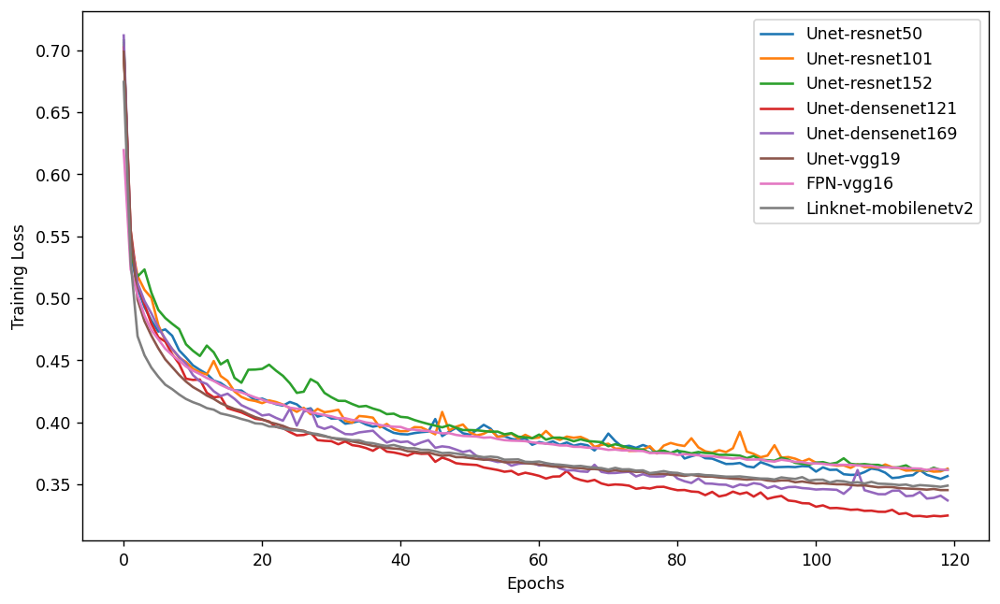

In [33]:
plt.figure(figsize = (10, 6), dpi = 125)
sns.lineplot(data = mds_hist_df, dashes = False);

plt.xlabel('Epochs');
plt.ylabel('Training Loss');

# plt.savefig(f'{path}/output_{i + 1}.jpg', format = 'jpg', dpi = 1200)
plt.savefig(f'{path}/train_loss.jpg', format = 'jpg', dpi = 1200)

### Training IoU Comparison

In [34]:
mds_histories = []

for m in model_names:
    md = m.split('-')[0]
    bk = m.split('-')[1]

    file = open(f'{models_path}/{md}_{bk}/histroy_dict.txt', 'r')
    contents = file.read()

    dt = ast.literal_eval(contents)
    mds_histories.append(dt['iou'])

In [35]:
mds_hist_df = pd.DataFrame((mds_histories), index = model_names)
mds_hist_df = mds_hist_df.T

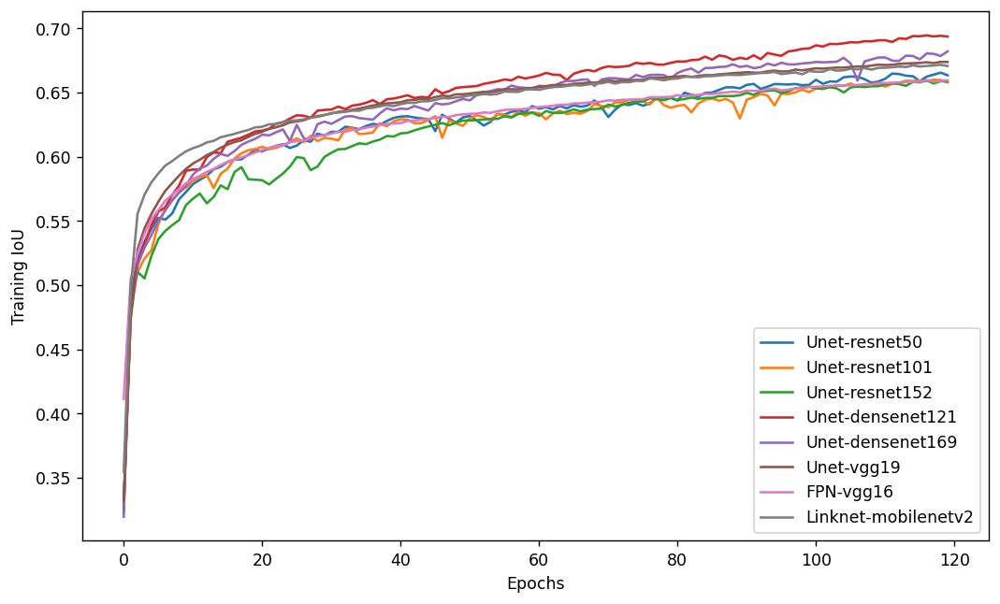

In [36]:
plt.figure(figsize = (10, 6), dpi = 125)
sns.lineplot(data = mds_hist_df, dashes = False);

plt.xlabel('Epochs');
plt.ylabel('Training IoU');
plt.savefig(f'{path}/train_iou.jpg', format = 'jpg', dpi = 600)

### Validation Loss Comparison

In [37]:
mds_histories = []

for m in model_names:
    md = m.split('-')[0]
    bk = m.split('-')[1]

    file = open(f'{models_path}/{md}_{bk}/histroy_dict.txt', 'r')
    contents = file.read()

    dt = ast.literal_eval(contents)
    mds_histories.append(dt['val_loss'])

mds_hist_df = pd.DataFrame((mds_histories), index = model_names)
mds_hist_df = mds_hist_df.T

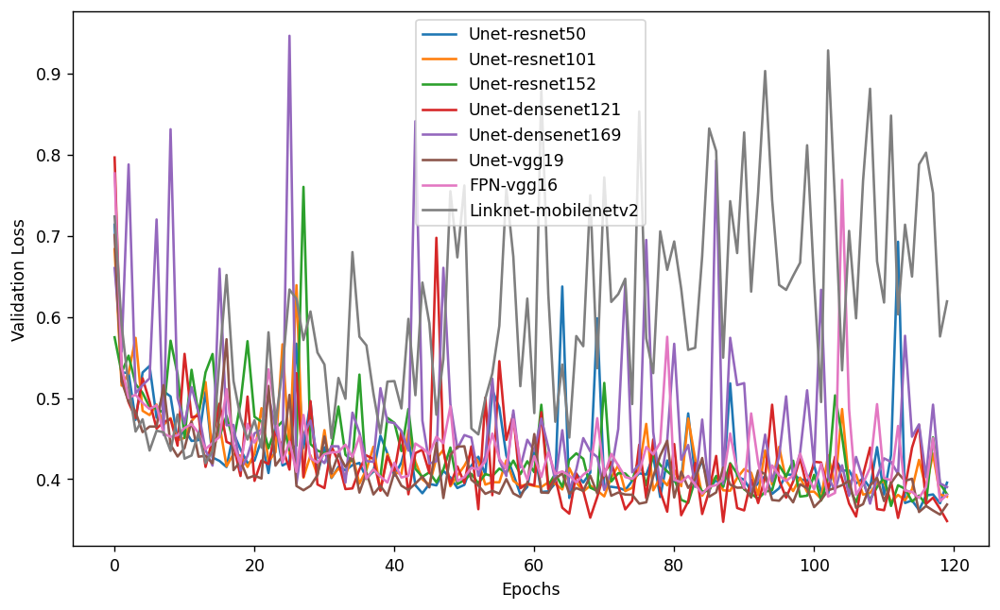

In [38]:
plt.figure(figsize = (10, 6), dpi = 125)
sns.lineplot(data = mds_hist_df, dashes = False);

plt.xlabel('Epochs');
plt.ylabel('Validation Loss');
plt.savefig(f'{path}/val_loss.jpg', format = 'jpg', dpi = 600)

### Validation IoU Comparison

In [39]:
mds_histories = []

for m in model_names:
    md = m.split('-')[0]
    bk = m.split('-')[1]

    file = open(f'{models_path}/{md}_{bk}/histroy_dict.txt', 'r')
    contents = file.read()

    dt = ast.literal_eval(contents)
    mds_histories.append(dt['val_iou'])

mds_hist_df = pd.DataFrame((mds_histories), index = model_names)
mds_hist_df = mds_hist_df.T

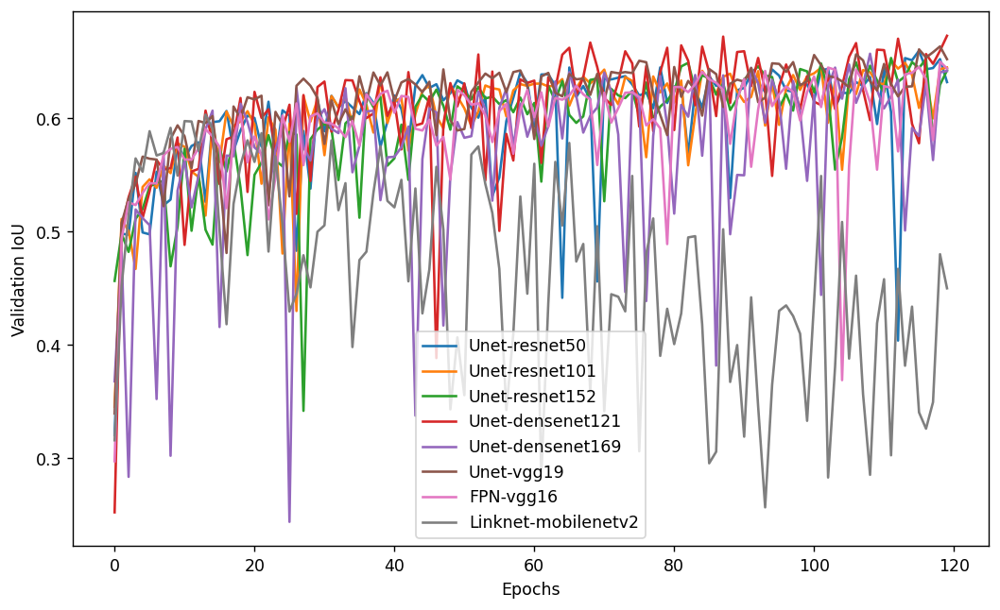

In [40]:
plt.figure(figsize = (10, 6), dpi = 125)
sns.lineplot(data = mds_hist_df, dashes = False);

plt.xlabel('Epochs');
plt.ylabel('Validation IoU');
plt.savefig(f'{path}/val_iou.jpg', format = 'jpg', dpi = 600)